In this notebook, I will perform SNP overrepresentation analysis on the \
endothelial eGRN data that were generated for a select list of target genes\
that were of high average expression in pseudobulked endothelial cells\
in the Zhu et al 2023 brain dataset.

In [1]:
library(tidyverse)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


In [2]:
getwd()

[1] "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2023_Zhu_et_al/Zhu_et_al_2023/24_09_24"

In [3]:
here::here()

[1] "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2023_Zhu_et_al/Zhu_et_al_2023/24_09_24"

In [4]:
library(Seurat)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t




In [5]:
library(Signac)

In [6]:
library(Pando)


Attaching package: ‘Pando’


The following objects are masked from ‘package:Seurat’:

    GetAssay, VariableFeatures


The following objects are masked from ‘package:SeuratObject’:

    LayerData, VariableFeatures




In [7]:
list.files(here::here('R_Objects')) %>% print

 [1] "DE_data_sig_EC.RDS"                  
 [2] "EC_detected_peaks_min1.RDS"          
 [3] "EC_detected_peaks_min5.RDS"          
 [4] "EC_eGRN_min1_Zhu_et_al_Pando_obj.RDS"
 [5] "EC_eGRN_regions_min1_Granges.RDS"    
 [6] "endothelial_genes_subsetted.RDS"     
 [7] "endothelial_genes.RDS"               
 [8] "important_TFs_EC_min1.RDS"           
 [9] "important_TFs_EC_min5.RDS"           
[10] "Zhu_et_al_eGRNs_combined.RDS"        
[11] "Zhu_et_al_Pando_w_eGRNs_SLURM_c1.RDS"
[12] "Zhu_et_al_Pando_w_eGRNs_SLURM_c2.RDS"
[13] "Zhu_et_al_Pando_w_eGRNs_SLURM_c3.RDS"
[14] "Zhu_et_al_Pando_w_eGRNs_SLURM_c4.RDS"
[15] "Zhu_et_al_Pando_w_eGRNs_SLURM_c5.RDS"
[16] "Zhu_et_al_Pando_w_eGRNs_SLURM_c6.RDS"
[17] "Zhu_et_al_Pando_w_motifs.RDS"        


In [8]:
Zhu_et_al_eGRNs <- readRDS(here::here("R_Objects", "Zhu_et_al_eGRNs_combined.RDS"))

In [9]:
Zhu_et_al_eGRNs

An object of class "GRNData"
Slot "grn":
A RegulatoryNetwork object based on 1014 transcription factors

1 inferred network: glm_network

Slot "data":
An object of class Seurat 
364381 features across 45549 samples within 3 assays 
Active assay: SCT (30146 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 2 other assays present: RNA, peaks
 7 dimensional reductions calculated: pca, umap.rna, lsi, umap.atac, wnn.umap, pca.harmony, lsi.harmony


In [10]:
library(traseR)

Loading required package: GenomicRanges

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following object is masked from ‘package:SeuratObject’:

    intersect


The following objects are masked from ‘package:lubridate’:

    intersect, setdiff, union


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, table,
    tapply, union, unique, unsplit, which.max, which.min


Loading required package: S4Vectors


Attachi

In [11]:
data(CEU)  # all SNPs that contain both trait-associated and non-associated SNPs.

In [12]:
# data(taSNP) # SNPs significantly associated with a trait.

In [13]:
# load trait associated SNPs including LD and all SNPs:

data(taSNPLD)

In [14]:
# read the R object containing the detected peaks in at least one endothelial cells:

EC_detected_peaks_min1 <- readRDS(here::here("R_Objects", "EC_detected_peaks_min1.RDS"))

In [15]:
EC_detected_peaks_min1 %>% head

[1] "chr1-10063-10327"   "chr1-180726-180979" "chr1-190727-191632"
[4] "chr1-777615-779293" "chr1-816964-817422" "chr1-818686-818982"

In [16]:
EC_detected_peaks_min1 %>% length

[1] 144345

In [18]:
# width distribution of the peak regions:

EC_detected_peaks_min1 %>% 
Signac::StringToGRanges(sep = c('-','-')) %>% 
width %>% 
summary

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  201.0   446.0   690.0   804.8  1050.0  4207.0 

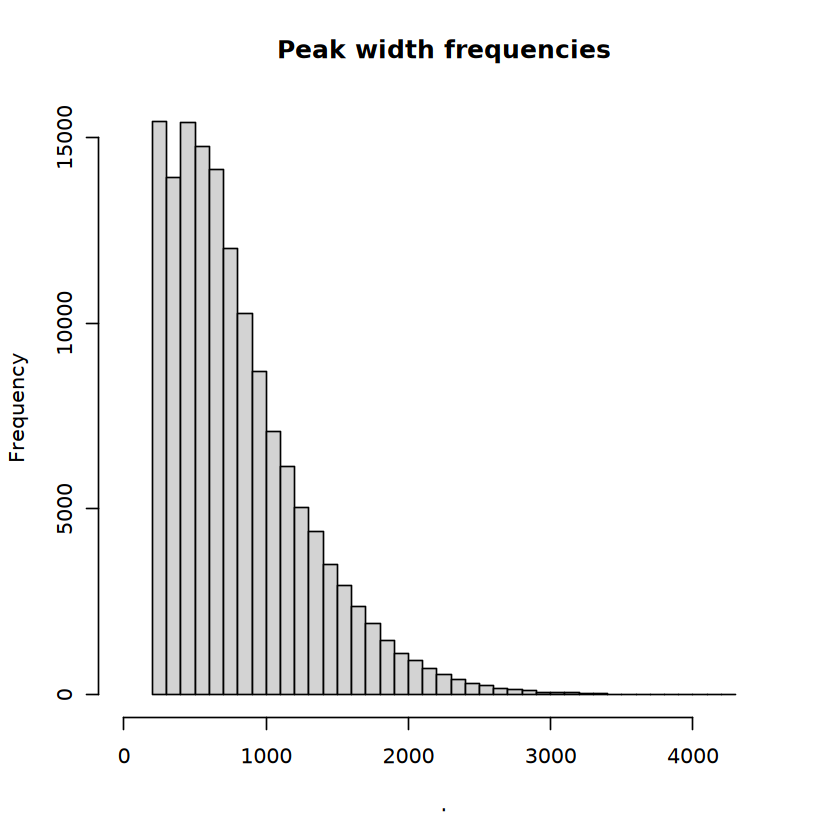

In [19]:
EC_detected_peaks_min1 %>% 
Signac::StringToGRanges(sep = c('-','-')) %>% 
width %>% 
hist(xlim = c(0, 4500), 
          breaks = 50, 
          main = 'Peak width frequencies')

In [21]:
options(repr.plot.width = 15, repr.plot.height = 7)

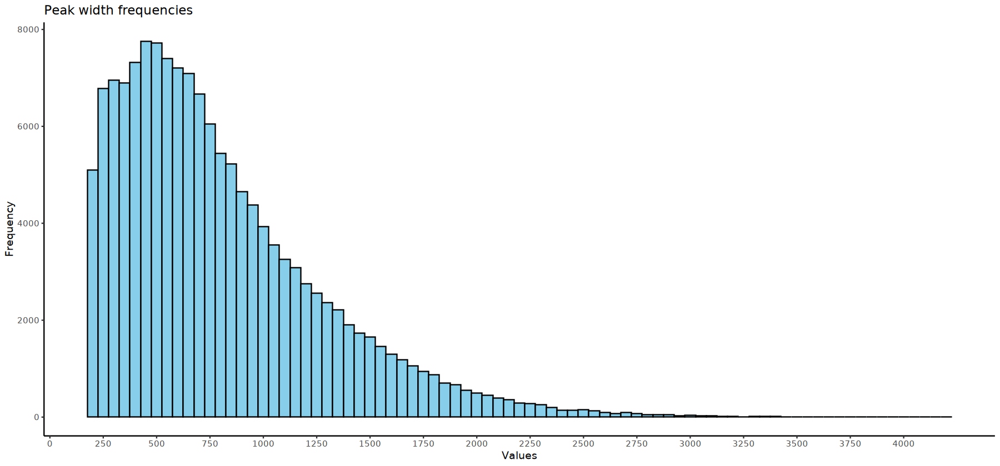

In [22]:
# ggplot version with specified x axis tick labels:

EC_detected_peaks_min1 %>% 
Signac::StringToGRanges(sep = c('-','-')) %>% 
width %>% 
data.frame(width = .) %>% 
ggplot(aes(x = width)) +
  geom_histogram(binwidth = 50, color = "black", fill = "skyblue") +
  labs(title = "Peak width frequencies", x = "Values", y = "Frequency") +
  scale_x_continuous(breaks = seq(0, 4000, by = 250)) +
  # Classic theme
  theme_classic()

In [23]:
# view distribution as vertical output:

EC_detected_peaks_min1 %>% 
Signac::StringToGRanges(sep = c('-','-')) %>% 
width %>% 
data.frame(width = .) %>% summary

     width       
 Min.   : 201.0  
 1st Qu.: 446.0  
 Median : 690.0  
 Mean   : 804.8  
 3rd Qu.:1050.0  
 Max.   :4207.0  

In [24]:
EC_detected_peaks_min1 %>% length

[1] 144345

In [25]:
# filter in eGRN connections for EC accessibile regions:

EC_eGRN_min1_Zhu_et_al <- Zhu_et_al_eGRNs

EC_eGRN_min1_Zhu_et_al@grn@networks$glm_network@coefs <- 
                EC_eGRN_min1_Zhu_et_al@grn@networks$glm_network@coefs %>% 
                            filter(region %in% EC_detected_peaks_min1)

In [26]:
coef(EC_eGRN_min1_Zhu_et_al) %>% dim

[1] 11159    11

In [27]:
coef(Zhu_et_al_eGRNs) %>% dim

[1] 919602     11

In [28]:
EC_eGRN_min1_Zhu_et_al  <- find_modules(
    EC_eGRN_min1_Zhu_et_al, 
    p_thresh = 0.1,
    nvar_thresh = 2, 
    min_genes_per_module = 1, 
    rsq_thresh = 0.05
)

Found 250 TF modules



In [29]:
EC_eGRN_min1_Zhu_et_al %>% NetworkModules %>% .@meta %>% head

tf,target,estimate,n_regions,n_genes,n_tfs,regions,pval,padj
<chr>,<chr>,<dbl>,<int>,<int>,<int>,<chr>,<dbl>,<dbl>
AEBP2,ATP2B1,0.02486657,4,10,3,chr12-89707060-89707304,0.0080975973,0.061764430
AEBP2,CAMK1D,0.03421972,1,10,1,chr10-12699395-12699595,0.0006356896,0.008522961
AEBP2,CNTNAP2,0.06680273,1,10,1,chr7-148809909-148810164,0.0025240192,0.025500072
AEBP2,DMD,0.05752384,1,10,1,chrX-30992379-30992751,0.0034976167,0.032788445
AEBP2,NHSL1,-0.03879838,1,10,2,chr6-139588999-139589637,0.0006404508,0.008575795
AEBP2,PLCB1,0.07657219,3,10,3,chr20-9945452-9945665,0.0033085371,0.031437162


In [30]:
# EC_eGRN_min1_Zhu_et_al %>% 
#     saveRDS(here::here('R_Objects', 'EC_eGRN_min1_Zhu_et_al_Pando_obj.RDS'))

# EC_eGRN_min1_Zhu_et_al  <-  
#     readRDS(here::here('R_Objects', 'EC_eGRN_min1_Zhu_et_al_Pando_obj.RDS'))

In [31]:
EC_eGRN_regions_min1 <- 
    EC_eGRN_min1_Zhu_et_al %>% 
    NetworkModules() %>% 
    .@meta %>% 
    select(regions)

In [32]:
EC_eGRN_regions_min1 %>% head

regions
<chr>
chr12-89707060-89707304
chr10-12699395-12699595
chr7-148809909-148810164
chrX-30992379-30992751
chr6-139588999-139589637
chr20-9945452-9945665


In [33]:
EC_eGRN_regions_min1 <- 
    EC_eGRN_regions_min1 %>% 
    pull(regions) %>% 
    str_split(pattern = ';') %>% 
    unlist

In [34]:
EC_eGRN_regions_min1 %>% length

[1] 1247

In [35]:
EC_eGRN_regions_min1 %>% head %>% print

[1] "chr12-89707060-89707304"  "chr10-12699395-12699595" 
[3] "chr7-148809909-148810164" "chrX-30992379-30992751"  
[5] "chr6-139588999-139589637" "chr20-9945452-9945665"   


In [36]:
EC_eGRN_regions_min1 %>% unique %>% length

[1] 744

In [37]:
EC_eGRN_regions_min1 <- EC_eGRN_regions_min1 %>% unique

In [38]:
EC_eGRN_regions_min1 %>% length

[1] 744

In [39]:
# convert to Granges object:

In [40]:
EC_eGRN_regions_min1 <- EC_eGRN_regions_min1 %>% Signac::StringToGRanges(sep = c('-', '-'))

In [41]:
EC_eGRN_regions_min1

GRanges object with 744 ranges and 0 metadata columns:
        seqnames              ranges strand
           <Rle>           <IRanges>  <Rle>
    [1]    chr12   89707060-89707304      *
    [2]    chr10   12699395-12699595      *
    [3]     chr7 148809909-148810164      *
    [4]     chrX   30992379-30992751      *
    [5]     chr6 139588999-139589637      *
    ...      ...                 ...    ...
  [740]    chr13 106533053-106533381      *
  [741]     chr1 245649283-245649486      *
  [742]    chr16   81908929-81909220      *
  [743]    chr20   37898263-37898766      *
  [744]     chr9     3700012-3700212      *
  -------
  seqinfo: 23 sequences from an unspecified genome; no seqlengths

In [42]:
EC_eGRN_regions_min1 %>% 
    saveRDS(here::here('R_Objects', 'EC_eGRN_regions_min1_Granges.RDS'))

In [43]:
# view distribution of widths:

EC_eGRN_regions_min1 %>% GenomicRanges::width() %>% summary()

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  201.0   219.0   261.0   306.6   310.2  1689.0 

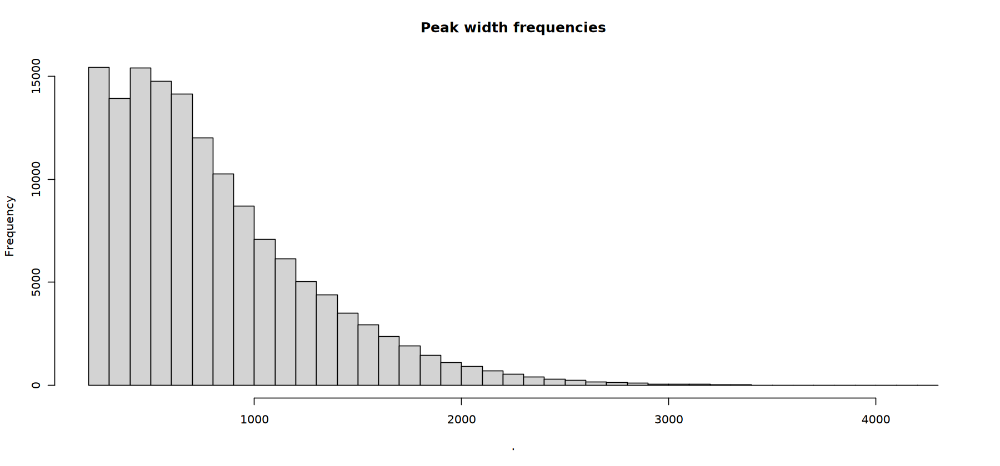

In [47]:
# distribution of region widths included in EC-specific EGRN:
EC_detected_peaks_min1 %>% 
Signac::StringToGRanges(sep = c('-','-')) %>% 
width %>% 
hist(#xlim = c(0, 2000), 
          breaks = 50, 
          main = 'Peak width frequencies')

In [48]:
# check the number of regions detected in at least 5 EC cells:

EC_detected_peaks_min5 <- readRDS(here::here("R_Objects", "EC_detected_peaks_min5.RDS"))

In [49]:
EC_detected_peaks_min5 %>% length

[1] 46362

In [50]:
# filter in eGRN connections for accessibile regions in at leat 5 EC cells:

EC_eGRN_min5_Zhu_et_al <- Zhu_et_al_eGRNs

EC_eGRN_min5_Zhu_et_al@grn@networks$glm_network@coefs <- 
                EC_eGRN_min5_Zhu_et_al@grn@networks$glm_network@coefs %>% 
                            filter(region %in% EC_detected_peaks_min5)

In [52]:
coef(EC_eGRN_min5_Zhu_et_al) %>% dim

[1] 2108   11

In [53]:
EC_eGRN_min5_Zhu_et_al  <- find_modules(
    EC_eGRN_min5_Zhu_et_al, 
    p_thresh = 0.1,
    nvar_thresh = 2, 
    min_genes_per_module = 1, 
    rsq_thresh = 0.05
)

Found 150 TF modules



In [54]:
EC_eGRN_min5_Zhu_et_al %>% NetworkModules %>% .@meta %>% head

tf,target,estimate,n_regions,n_genes,n_tfs,regions,pval,padj
<chr>,<chr>,<dbl>,<int>,<int>,<int>,<chr>,<dbl>,<dbl>
AEBP2,SCAI,0.031959743,1,2,3,chr9-124658001-124659689,1.023475e-07,4.458289e-06
AEBP2,TTC28,-0.042947466,1,2,1,chr22-27718237-27718488,1.645291e-03,1.824974e-02
ALX4,SVIL,0.075295164,1,1,2,chr10-29177307-29177610,1.204353e-02,8.251141e-02
AR,TIMP3,-0.078709249,1,1,3,chr22-32971298-32971609,1.393674e-02,9.162649e-02
ARNT2,INPP5D,-0.025604814,2,1,5,chr2-233064143-233064352,1.384322e-03,1.592123e-02
BACH1,PDGFB,0.009095507,1,1,2,chr22-39290809-39291081,7.707803e-04,9.964308e-03


In [55]:
EC_eGRN_regions_min5 <- 
    EC_eGRN_min5_Zhu_et_al %>% 
    NetworkModules() %>% 
    .@meta %>% 
    select(regions)

In [56]:
EC_eGRN_regions_min5 %>% head

regions
<chr>
chr9-124658001-124659689
chr22-27718237-27718488
chr10-29177307-29177610
chr22-32971298-32971609
chr2-233064143-233064352
chr22-39290809-39291081


In [57]:
EC_eGRN_regions_min5 <- 
    EC_eGRN_regions_min5 %>% 
    pull(regions) %>% 
    str_split(pattern = ';') %>% 
    unlist

In [58]:
EC_eGRN_regions_min5 %>% length

[1] 344

In [59]:
EC_eGRN_regions_min5 %>% head %>% print

[1] "chr9-124658001-124659689" "chr22-27718237-27718488" 
[3] "chr10-29177307-29177610"  "chr22-32971298-32971609" 
[5] "chr2-233064143-233064352" "chr22-39290809-39291081" 


In [60]:
EC_eGRN_regions_min5 %>% unique %>% length

[1] 179

In [61]:
EC_eGRN_regions_min5 <- EC_eGRN_regions_min5 %>% unique

In [62]:
EC_eGRN_regions_min5 %>% length

[1] 179

In [63]:
# convert to Granges object:

In [64]:
EC_eGRN_regions_min5 <- EC_eGRN_regions_min5 %>% Signac::StringToGRanges(sep = c('-', '-'))

In [65]:
EC_eGRN_regions_min5

GRanges object with 179 ranges and 0 metadata columns:
        seqnames              ranges strand
           <Rle>           <IRanges>  <Rle>
    [1]     chr9 124658001-124659689      *
    [2]    chr22   27718237-27718488      *
    [3]    chr10   29177307-29177610      *
    [4]    chr22   32971298-32971609      *
    [5]     chr2 233064143-233064352      *
    ...      ...                 ...    ...
  [175]    chr15   89812236-89812553      *
  [176]    chr15   25710174-25710374      *
  [177]     chr5 154882073-154882273      *
  [178]    chr18   55251664-55251866      *
  [179]    chr13 106533053-106533381      *
  -------
  seqinfo: 22 sequences from an unspecified genome; no seqlengths

In [66]:
EC_eGRN_regions_min5 %>% 
    saveRDS(here::here('R_Objects', 'EC_eGRN_regions_min5_Granges.RDS'))

In [67]:
# view distribution of widths:

EC_eGRN_regions_min5 %>% GenomicRanges::width() %>% summary()

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  201.0   223.5   271.0   329.6   319.0  1689.0 

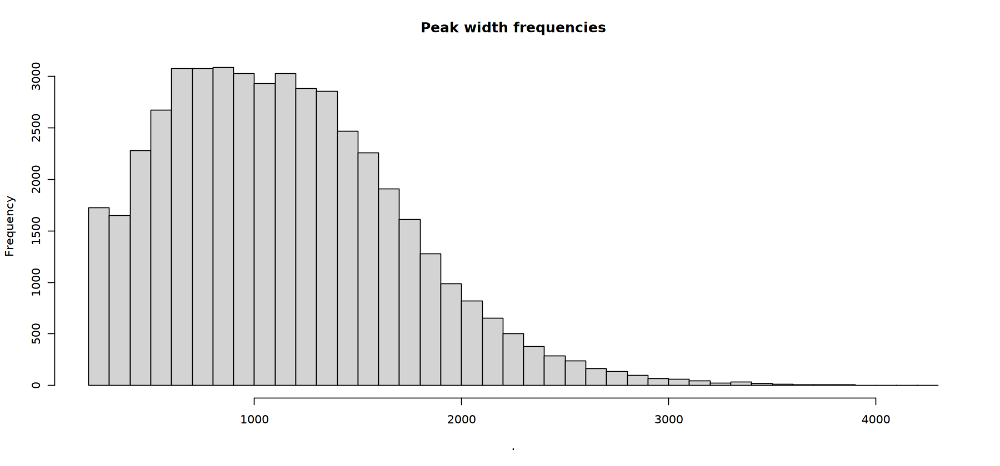

In [68]:
# distribution of region widths included in EC-specific EGRN:
EC_detected_peaks_min5 %>% 
Signac::StringToGRanges(sep = c('-','-')) %>% 
width %>% 
hist(#xlim = c(0, 2000), 
          breaks = 50, 
          main = 'Peak width frequencies')

In [69]:
list.files(here::here()) %>% print

 [1] "bash_scripts"                                                                           
 [2] "network_visualization_functions_simplified.r"                                           
 [3] "network_visualization_functions.r"                                                      
 [4] "PART_1_Prepare_endothelial_gene_list_for _Pando_eGRN_inference.ipynb"                   
 [5] "PART_2A_Exploration_of_eGRNs_for_each_chunk_of_target_genes_to_assess_consistency.ipynb"
 [6] "PART_2B_Concatanate_the_network_objects_of_chunked_genes_and_apply_FDR.ipynb"           
 [7] "PART_3_Comparison_of_Zhu_et_al_&_Mannens_et_al_endothelial_eGRNs.ipynb"                 
 [8] "PART_4_SNP_overrepresentation_analysis_on_endothelial_eGRNS_Zhu_et_al_data.ipynb"       
 [9] "R_Objects"                                                                              
[10] "SNP_enrichment_and_plotting_functions.R"                                                


In [70]:
source(here::here("network_visualization_functions.r"))

make sure you installed the GGally, network, igraph and ggraph packages :)

First option: One can directly use only the node_names parameter to specify 
          the gene names to visualize in the graph

Second option: Use TF-names and/or target genes parameters 
         to visualize their connections

Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2


‘network’ 1.18.2 (2023-12-04), part of the Statnet Project
* ‘news(package="network")’ for changes since last version
* ‘citation("network")’ for citation information
* ‘https://statnet.org’ for help, support, and other information



Attaching package: ‘igraph’


The following objects are masked from ‘package:network’:

    %c%, %s%, add.edges, add.vertices, delete.edges, delete.vertices,
    get.edge.attribute, get.edges, get.vertex.attribute, is.bipartite,
    is.directed, list.edge.attributes, list.vertex.attributes,
    set.edge.attribute, set.vertex.attribute


The following objects are masked from 

In [71]:
options(repr.plot.width = 30, repr.plot.height = 24) # for network.

 Network attributes:
  vertices = 705 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 1210 
    missing edges= 0 
    non-missing edges= 1210 

 Vertex attribute names: 
    vertex.names 

 Edge attribute names not shown 


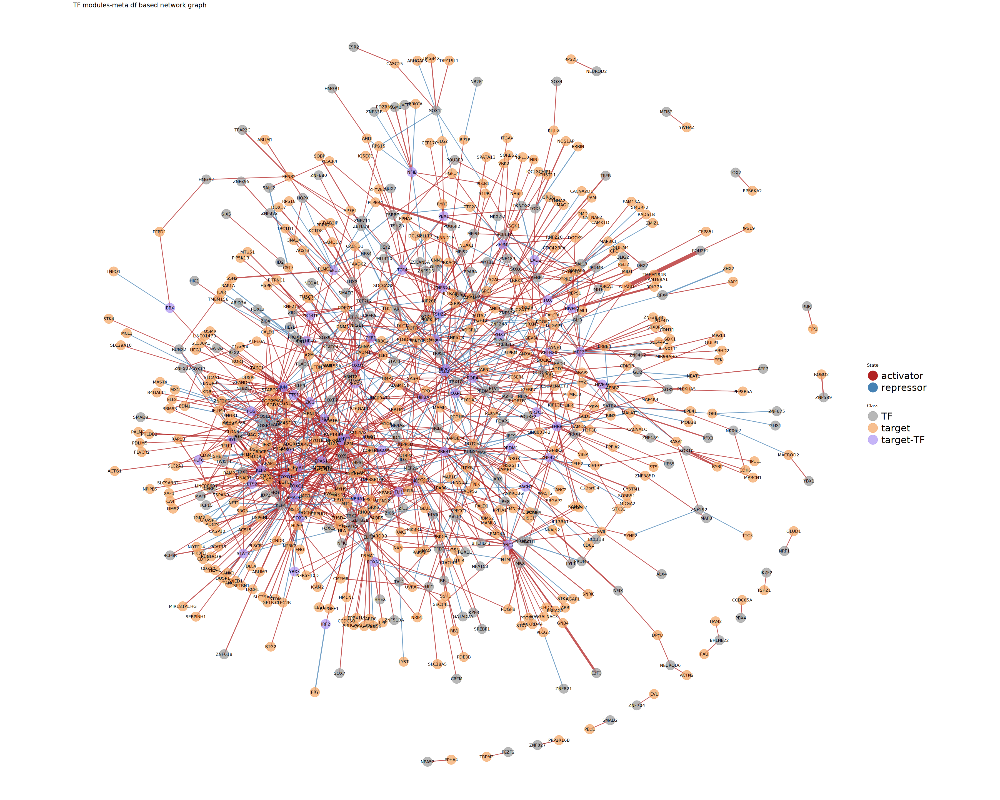

In [74]:
vis_network_w_GGNET2(meta_DF = EC_eGRN_min1_Zhu_et_al  %>% NetworkModules %>% .@meta, arrow = NULL)

 Network attributes:
  vertices = 297 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 339 
    missing edges= 0 
    non-missing edges= 339 

 Vertex attribute names: 
    vertex.names 

No edge attributes


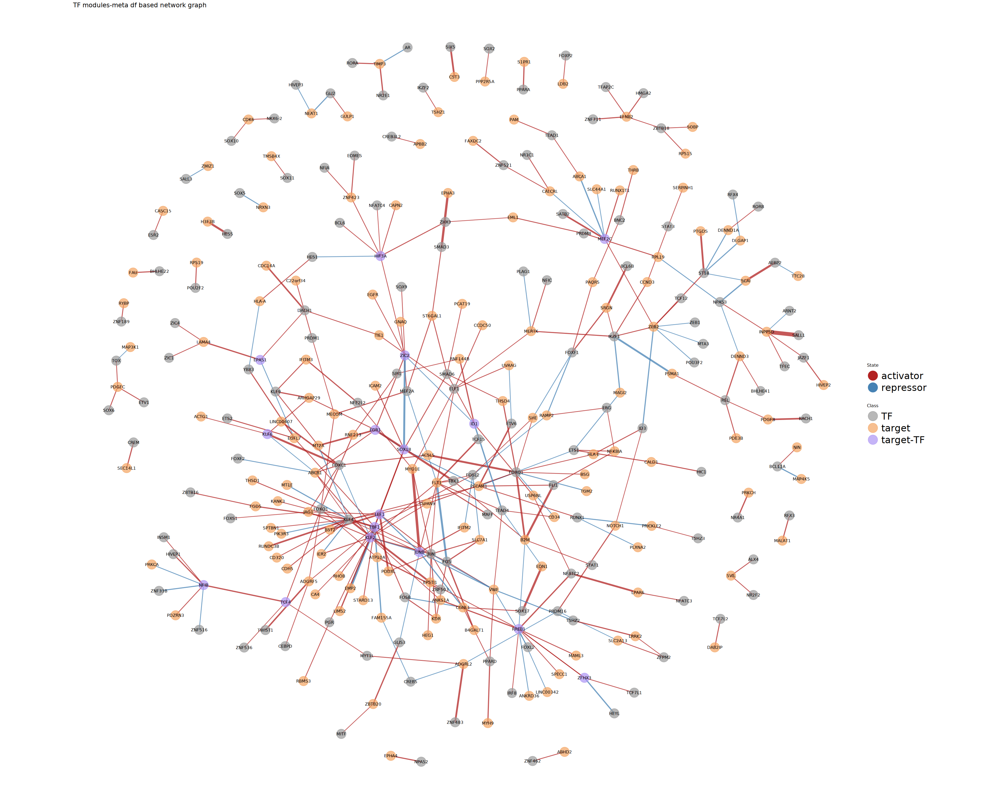

In [75]:
vis_network_w_GGNET2(meta_DF = EC_eGRN_min5_Zhu_et_al  %>% NetworkModules %>% .@meta, arrow = NULL)

In [76]:
list.files(here::here()) %>% print

 [1] "bash_scripts"                                                                           
 [2] "network_visualization_functions_simplified.r"                                           
 [3] "network_visualization_functions.r"                                                      
 [4] "PART_1_Prepare_endothelial_gene_list_for _Pando_eGRN_inference.ipynb"                   
 [5] "PART_2A_Exploration_of_eGRNs_for_each_chunk_of_target_genes_to_assess_consistency.ipynb"
 [6] "PART_2B_Concatanate_the_network_objects_of_chunked_genes_and_apply_FDR.ipynb"           
 [7] "PART_3_Comparison_of_Zhu_et_al_&_Mannens_et_al_endothelial_eGRNs.ipynb"                 
 [8] "PART_4_SNP_overrepresentation_analysis_on_endothelial_eGRNS_Zhu_et_al_data.ipynb"       
 [9] "R_Objects"                                                                              
[10] "SNP_enrichment_and_plotting_functions.R"                                                


In [77]:
source(here::here('SNP_enrichment_and_plotting_functions.R'))

In [78]:
# SNP enrichment:

# NO expansion of peak regions:

EC_detected_peaks_min1_SNPs <- 
    enrich_SNP_generic(granges_obj = EC_eGRN_regions_min1,
                       expand_by = NULL,
                       SNPs = taSNPLD)

Using whole genome as background in the statistical analysis....  


There are  227367 bp in the query region, accounting for  7.48828218557676e-05  of the genome.

There are  573 traits in the analysis.

There are  33 trait class in the analysis.

100 traits have been tested!

200 traits have been tested!

300 traits have been tested!

400 traits have been tested!

500 traits have been tested!

10 trait class have been tested!

20 trait class have been tested!

30 trait class have been tested!



Using all known SNPs as background in the statistical analysis....  


There are  227367 bp in the query region, accounting for  7.48828218557676e-05  of the genome.

There are  573 traits in the analysis.

There are  33 trait class in the analysis.

100 traits have been tested!

200 traits have been tested!

300 traits have been tested!

400 traits have been tested!

500 traits have been tested!

10 trait class have been tested!

20 trait class have been tested!

30 trait class have been tested!



In [79]:
options(repr.plot.width = 30, repr.plot.height = 14)

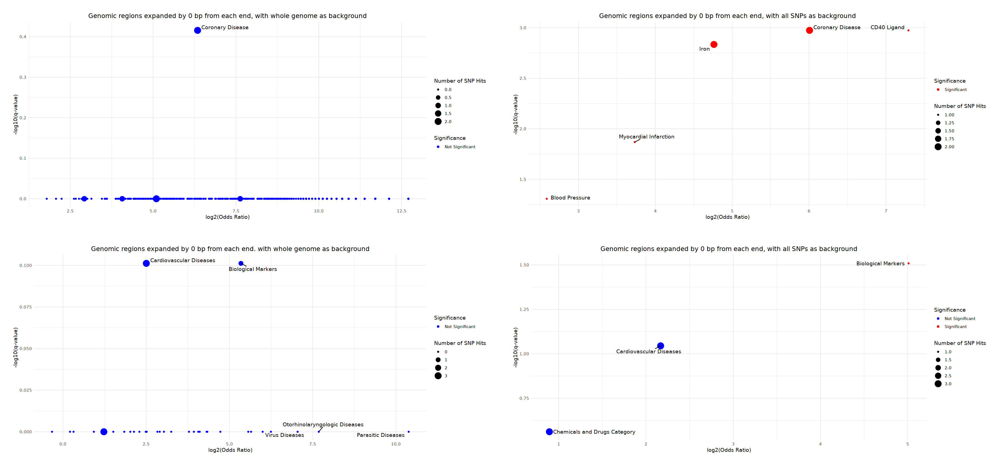

In [80]:
plot_for_diff_expansions(enriched_SNP_obj = EC_detected_peaks_min1_SNPs, expansion_value_string = '0 bp')

In [81]:
# SNP enrichment for genomic regions detected in at least 5 cells:

# NO expansion of peak regions:

EC_detected_peaks_min5_SNPs <- 
    enrich_SNP_generic(granges_obj = EC_eGRN_regions_min5,
                       expand_by = NULL,
                       SNPs = taSNPLD)

Using whole genome as background in the statistical analysis....  


There are  58813 bp in the query region, accounting for  1.9369932320008e-05  of the genome.

There are  573 traits in the analysis.

There are  33 trait class in the analysis.

100 traits have been tested!

200 traits have been tested!

300 traits have been tested!

400 traits have been tested!

500 traits have been tested!

10 trait class have been tested!

20 trait class have been tested!

30 trait class have been tested!



Using all known SNPs as background in the statistical analysis....  


There are  58813 bp in the query region, accounting for  1.9369932320008e-05  of the genome.

There are  573 traits in the analysis.

There are  33 trait class in the analysis.

Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chrX
  - in 'y': chr21
  Make sure to always combine/compare objects based on the same reference
  genome (use suppressWarnings() to suppress this warning).”
100 traits have been tested!

200 traits have been tested!

300 traits have been tested!

400 traits have been tested!

500 traits have been tested!

10 trait class have been tested!

20 trait class have been tested!

30 trait class have been tested!



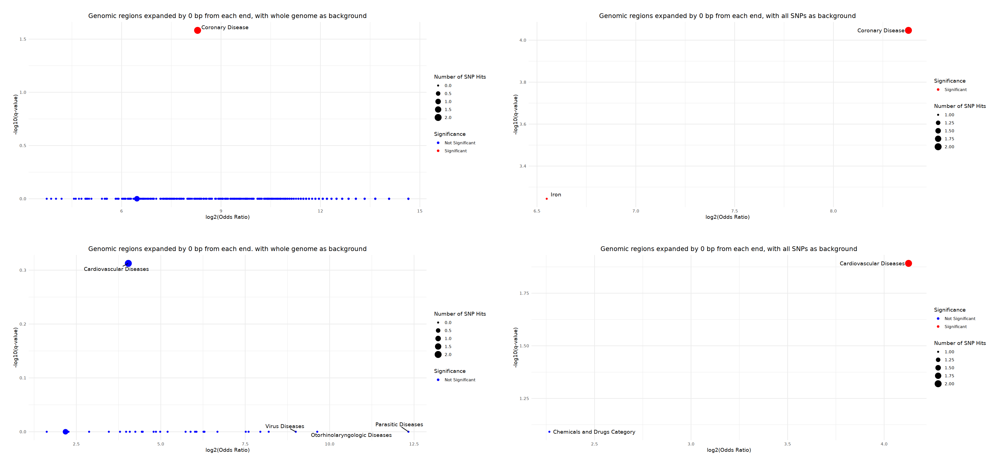

In [82]:
plot_for_diff_expansions(enriched_SNP_obj = EC_detected_peaks_min5_SNPs, expansion_value_string = '0 bp')

In [84]:
# Not much difference between the more stringent and lenient selection of genomic regions in ECs.

# I will try to apply expansions from both ends of the regions by increasing lengths.

Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  




Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  




Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  




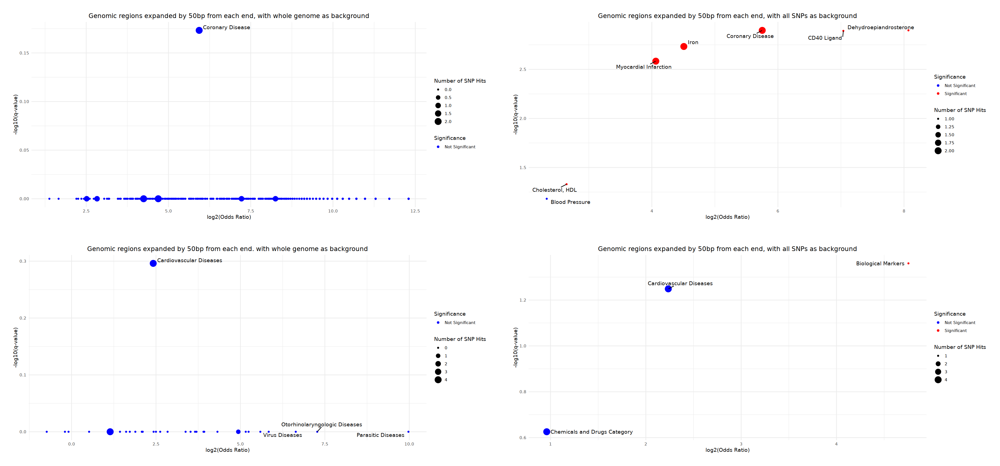

Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  




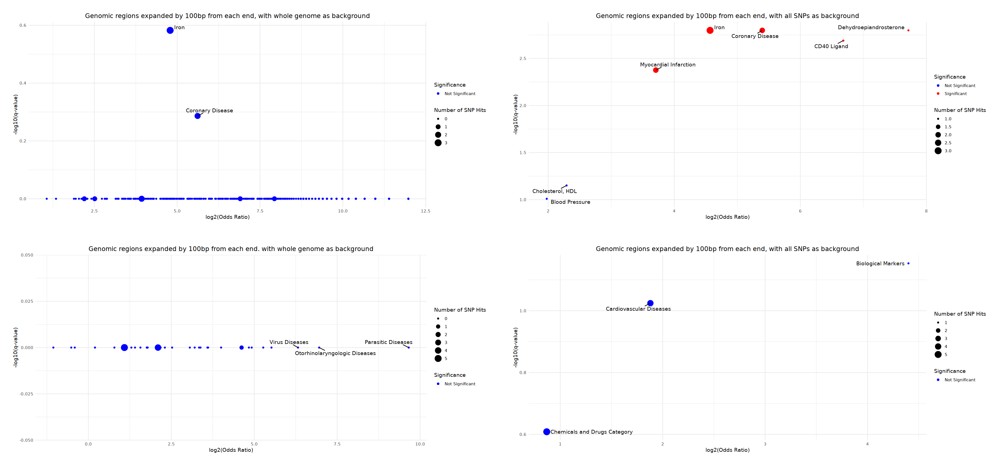

Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  




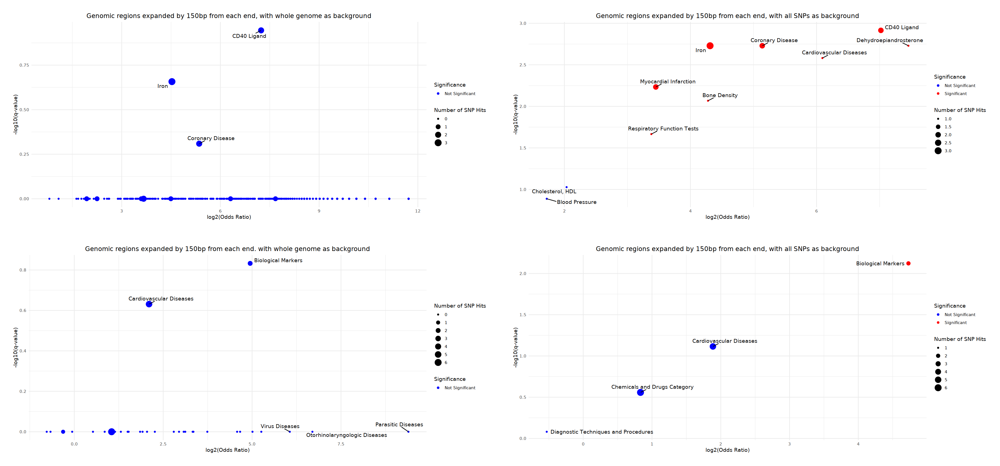

Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  




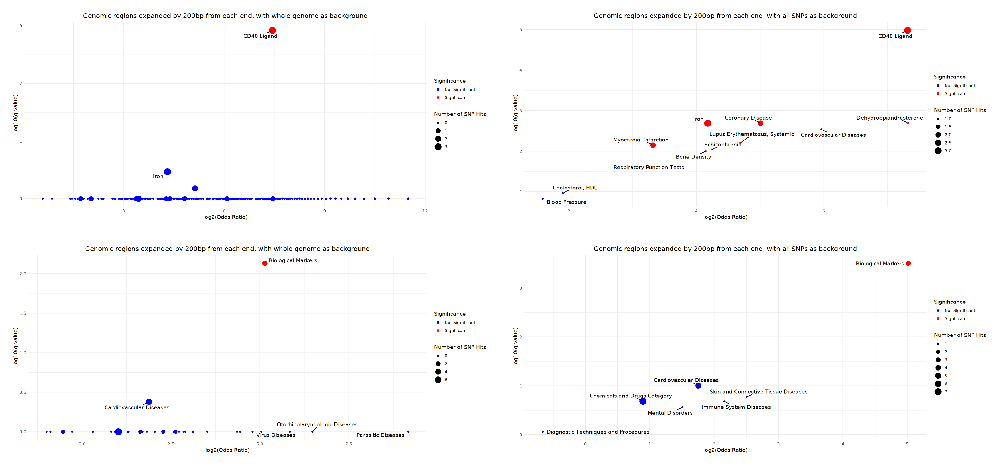

Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  




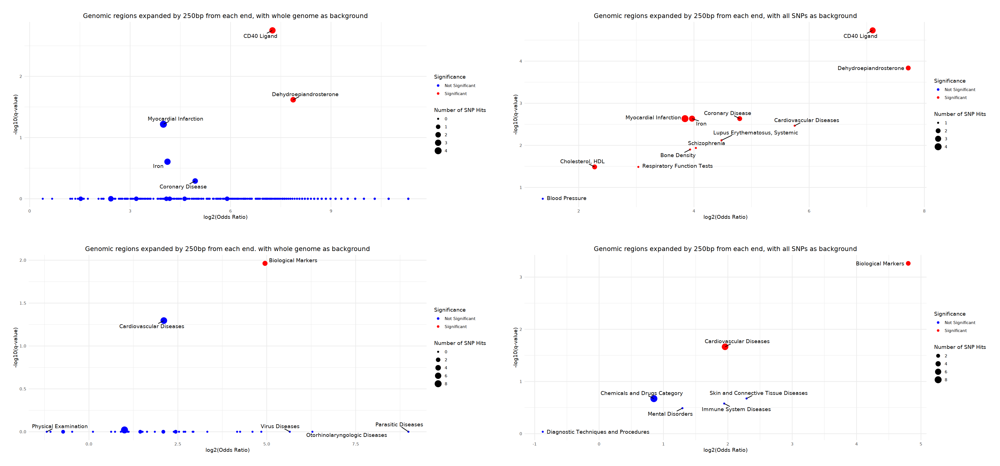

Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  




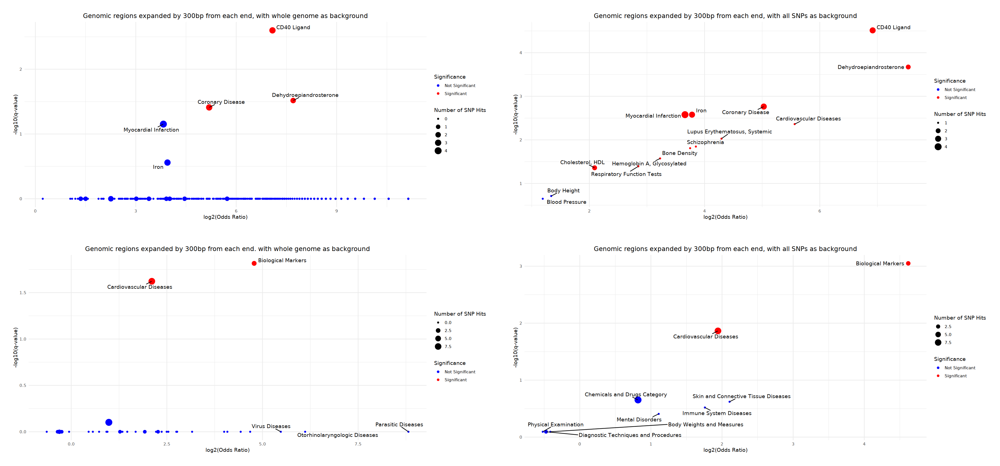

Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  




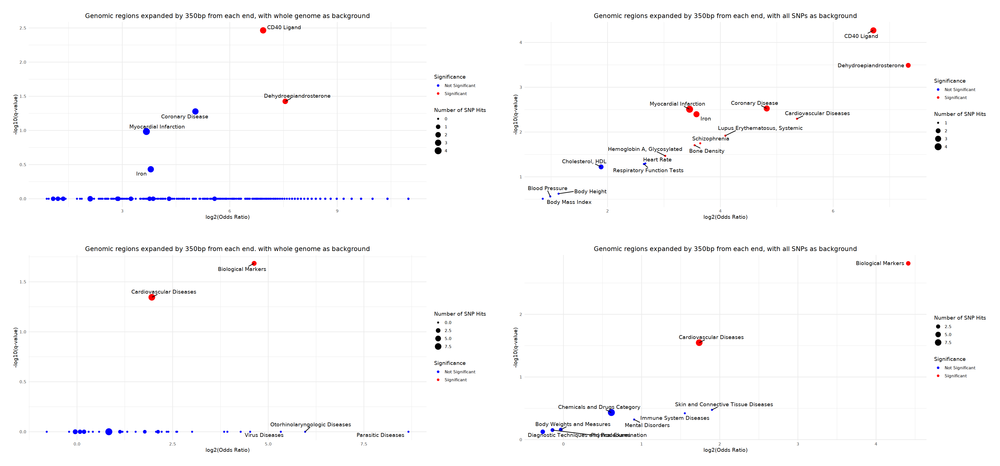

Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  




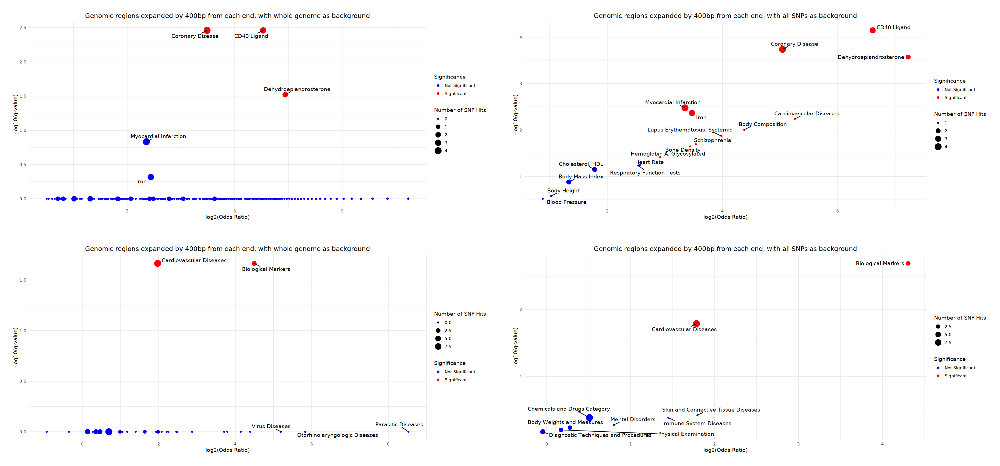

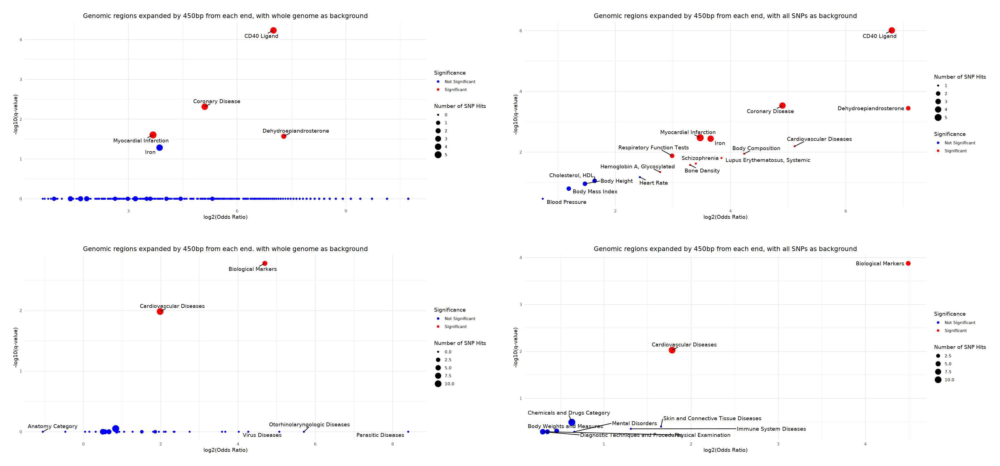

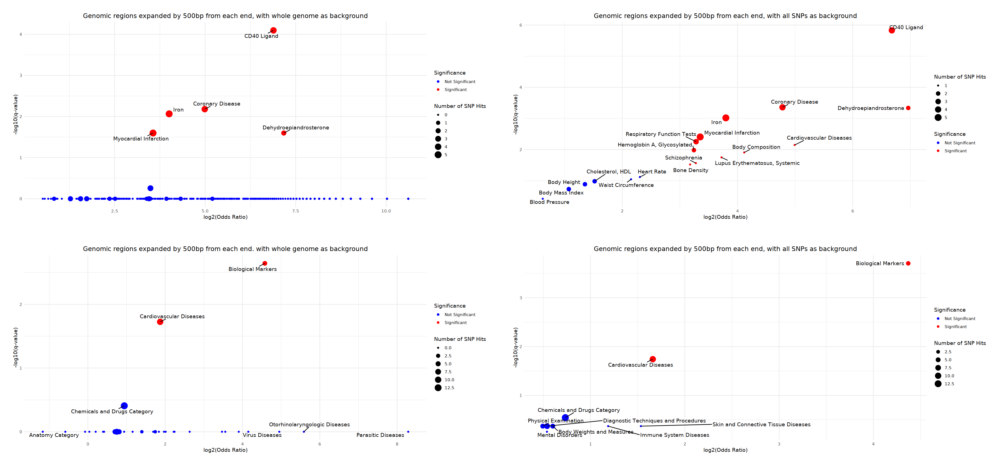

In [85]:
res_list_for_EC_min1 <- list()

for(expansion_bases in seq(from = 50, to = 500, by = 50)) {
    
    res_list_for_EC_min1[[paste0('expanded_by_', expansion_bases, 'bp')]] <- 
    enrich_SNP_generic(granges_obj = EC_eGRN_regions_min1,
                       expand_by = expansion_bases,
                       SNPs = taSNPLD,
                       suppress_messages = TRUE)
    
    cat('\n')

    plot_for_diff_expansions(enriched_SNP_obj = res_list_for_EC_min1[[paste0('expanded_by_', expansion_bases, 'bp')]], expansion_value_string = paste0(expansion_bases, 'bp'))
    
}

Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  


Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chrX
  - in 'y': chr21
  Make sure to always combine/compare objects based on the same reference
  genome (use suppressWarnings() to suppress this warning).”


Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  


Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chrX
  - in 'y': chr21
  Make sure to always combine/compare objects based on the same reference
  genome (use suppressWarnings() to suppress this warning).”


Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  


Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chrX
  - in 'y': chr21
  Make sure to always combine/compare objects based on the same reference
  genome (use suppressWarnings() to suppress this warning).”


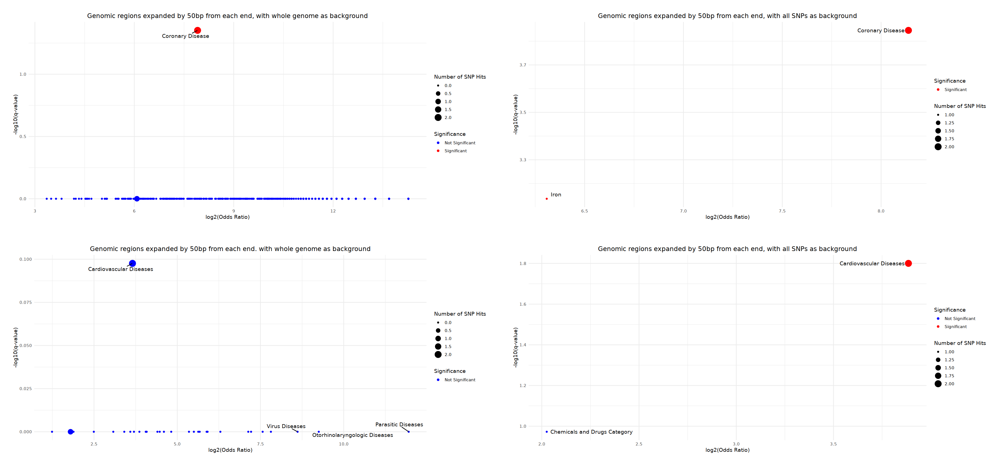

Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  


Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chrX
  - in 'y': chr21
  Make sure to always combine/compare objects based on the same reference
  genome (use suppressWarnings() to suppress this warning).”


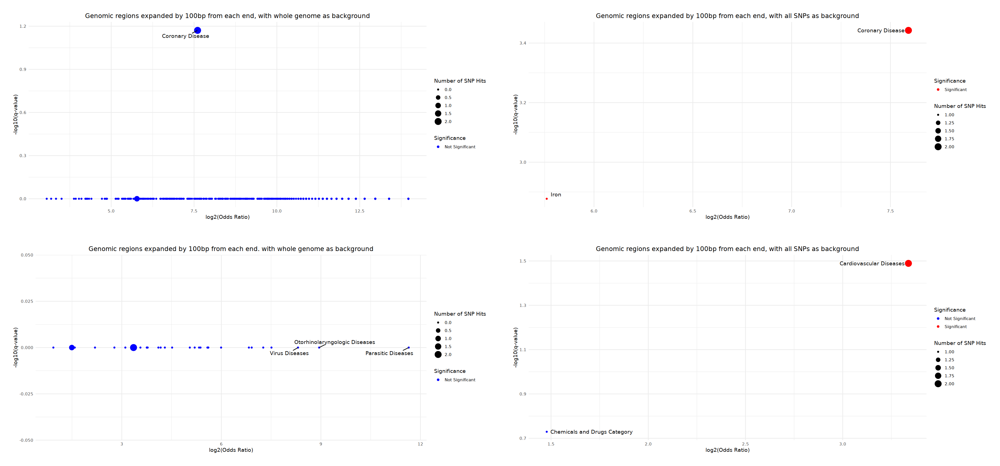

Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  


Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chrX
  - in 'y': chr21
  Make sure to always combine/compare objects based on the same reference
  genome (use suppressWarnings() to suppress this warning).”


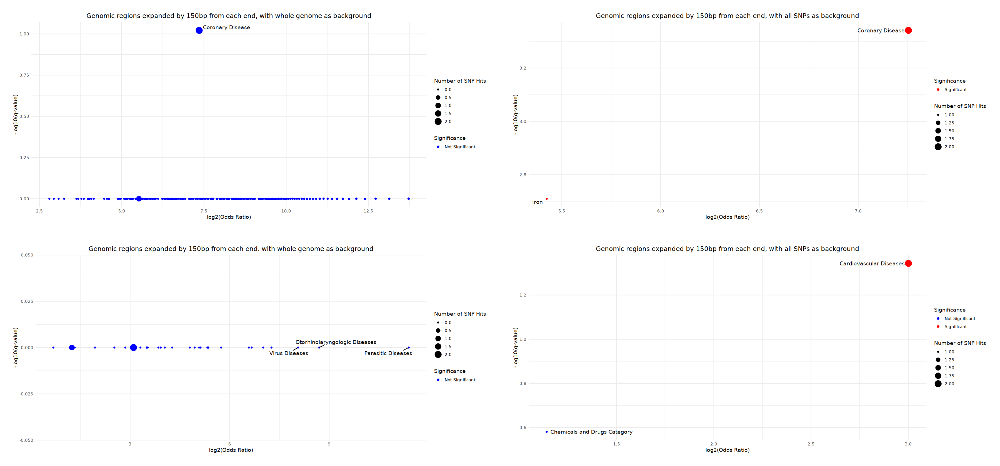

Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  


Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chrX
  - in 'y': chr21
  Make sure to always combine/compare objects based on the same reference
  genome (use suppressWarnings() to suppress this warning).”


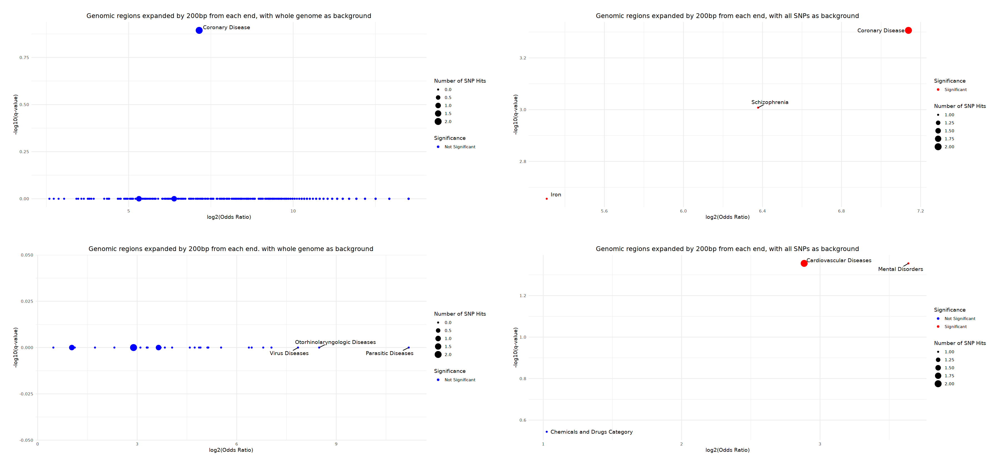

Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  


Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chrX
  - in 'y': chr21
  Make sure to always combine/compare objects based on the same reference
  genome (use suppressWarnings() to suppress this warning).”


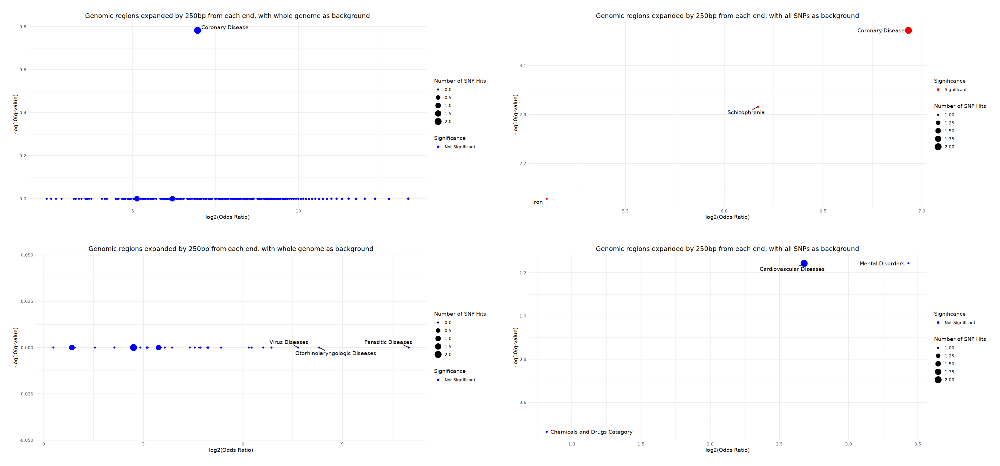

Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  


Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chrX
  - in 'y': chr21
  Make sure to always combine/compare objects based on the same reference
  genome (use suppressWarnings() to suppress this warning).”


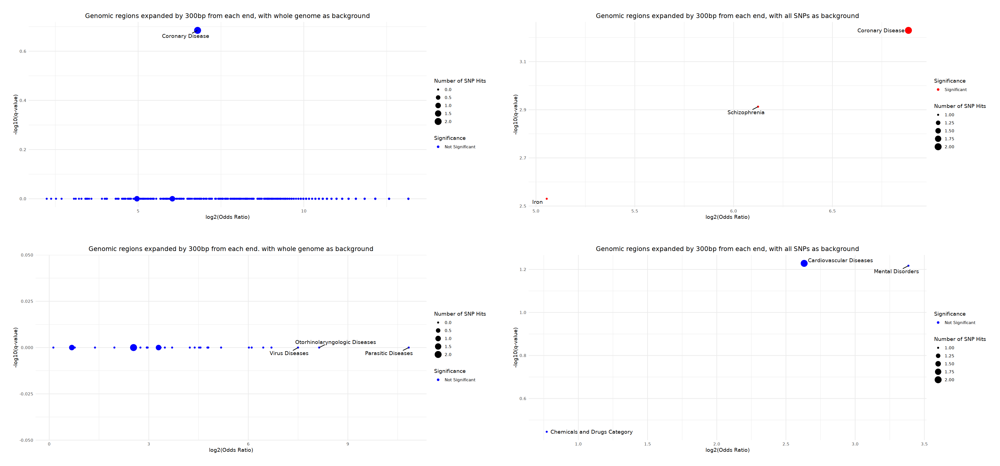

Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  


Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chrX
  - in 'y': chr21
  Make sure to always combine/compare objects based on the same reference
  genome (use suppressWarnings() to suppress this warning).”


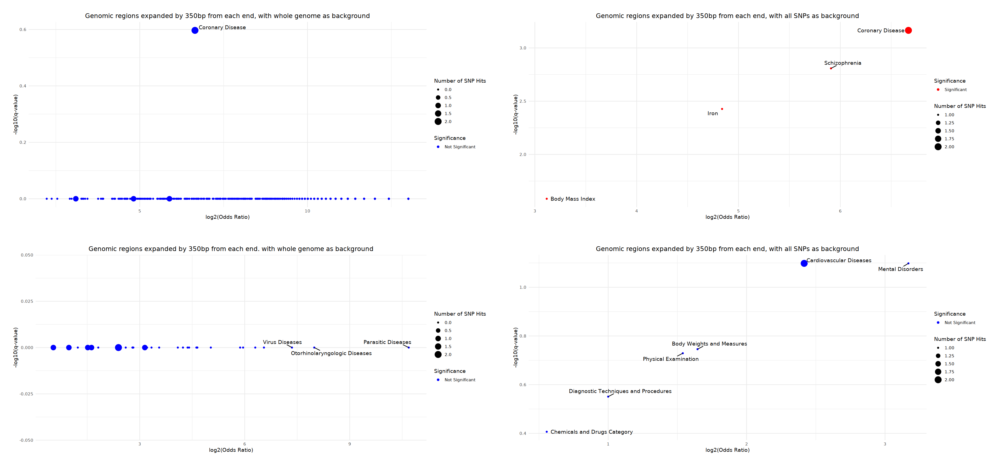

Using whole genome as background in the statistical analysis....  




Using all known SNPs as background in the statistical analysis....  


Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chrX
  - in 'y': chr21
  Make sure to always combine/compare objects based on the same reference
  genome (use suppressWarnings() to suppress this warning).”


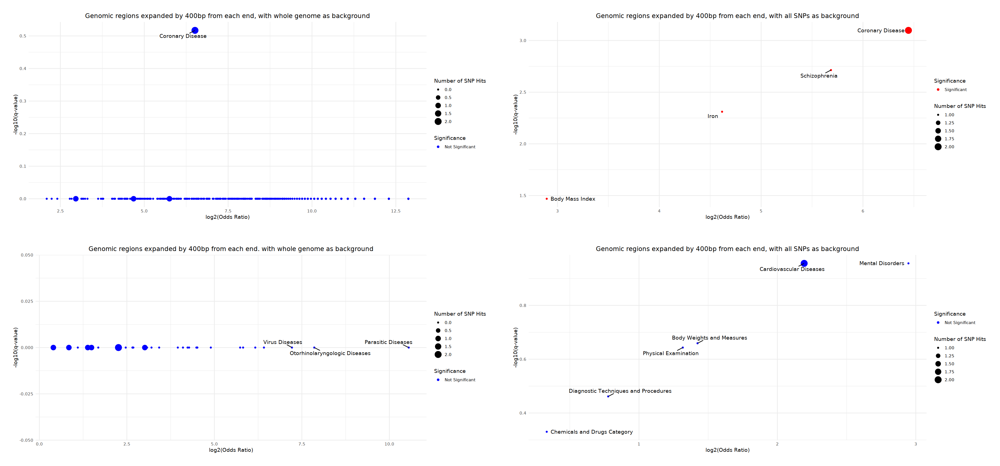

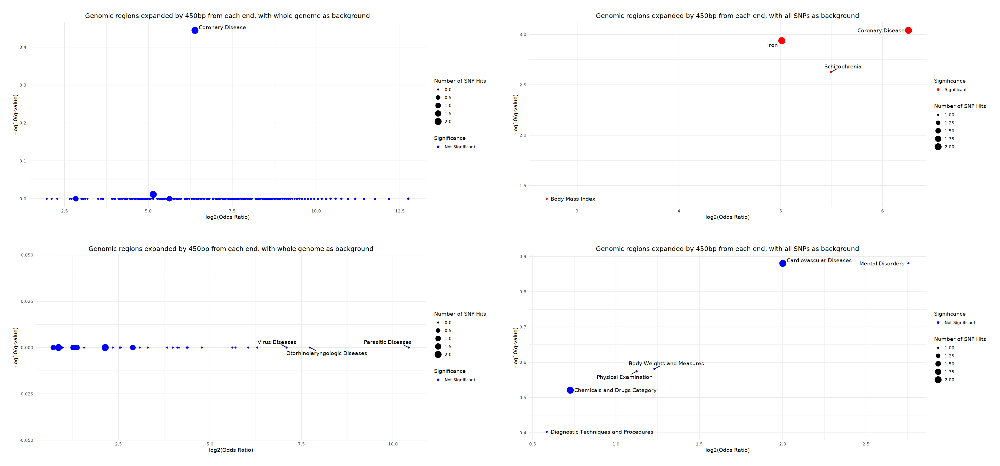

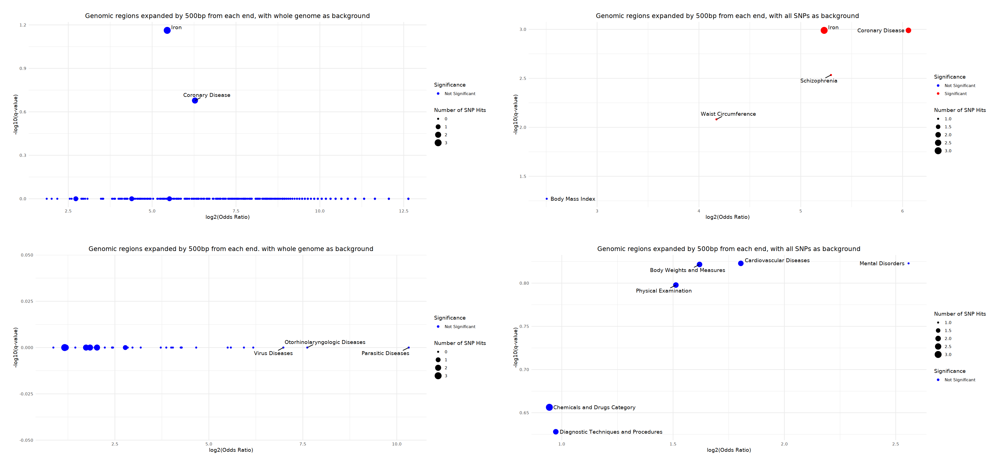

In [86]:
# SNP overrepresentaion analysis in chromatin regions accessibile in at least 5 endothelial cells:

res_list_for_EC_min5 <- list()

for(expansion_bases in seq(from = 50, to = 500, by = 50)) {
    
    res_list_for_EC_min5[[paste0('expanded_by_', expansion_bases, 'bp')]] <- 
    enrich_SNP_generic(granges_obj = EC_eGRN_regions_min5,
                       expand_by = expansion_bases,
                       SNPs = taSNPLD,
                       suppress_messages = TRUE)
    
    cat('\n')

    plot_for_diff_expansions(enriched_SNP_obj = res_list_for_EC_min5[[paste0('expanded_by_', expansion_bases, 'bp')]], expansion_value_string = paste0(expansion_bases, 'bp'))
    
}

In [88]:
# There are dramatically less enriched SNPs, which makes sense because the inputted accessible regions (at minimum 5 cells) 
# were very low in number.

# Next, I will try to run this analysis using other cell types.

In [89]:
sessionInfo()

R version 4.4.1 (2024-06-14)
Platform: x86_64-unknown-linux-gnu
Running under: Red Hat Enterprise Linux 9.4 (Plow)

Matrix products: default
BLAS/LAPACK: /gnu/store/mvbj21lcf387dgs04d29n0sxrydq03a6-openblas-0.3.20/lib/libopenblasp-r0.3.20.so;  LAPACK version 3.9.0

locale:
 [1] LC_CTYPE=en_GB.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_GB.UTF-8        LC_COLLATE=en_GB.UTF-8    
 [5] LC_MONETARY=en_GB.UTF-8    LC_MESSAGES=en_GB.UTF-8   
 [7] LC_PAPER=en_GB.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_GB.UTF-8 LC_IDENTIFICATION=C       

time zone: Europe/Berlin
tzcode source: system (glibc)

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] ggraph_2.2.1                      igraph_2.0.3                     
 [3] network_1.18.2                    GGally_2.2.1                     
 [5] traseR_1.34.0             